# **Machine Learning Model for the Planetary Albedo**
### The actual code represents the work performed by the student Sofia Strukova during the Google Summer of Code (GSoC) 2021 project which is a part of  the ML4SCI umbrella organization (https://ml4sci.org/). It was performed under the supervision of Patrick Peplowski (JHUAPL), Sergei Gleyzer (University of Alabama) and Jason Terry (University of Georgia). 

The experiments presented here were made with the use of the datasets described next.
For the Moon: albedo map, LPFe (iron map), LPK (potassium map), LPTh (thorium map), and LPTi (titanium) map.
For Mercury: the albedo map which is split into the top and bottom of the planet, chemical maps - Al to Si element ratio, Ca to Si element ratio, Fe to Si element ratio, Mg to Si element ratio, S to Si element ratio.
The maps are csv files with data that represents the element concentration at each location. They can be found in the following direction: https://github.com/strukovas/MLMAPPER/tree/main/data.

The goal of the project was to use machine learning techniques to identify relationships between planetary mapped datasets in order to provide deeper understanding of planetary surfaces and to have predictive power for planetary surfaces with incomplete datasets.
Planetary surfaces are observed as all electromagnetic wavelengths (e.g. radar, infrared, optical, ultraviolet, x-ray, gamma-ray), and each wavelength provides unique information about the chemistry, mineralogy, and history of the surface. Yet the information is not entirely independent. For example, the chemical element iron, which is mapped with x-rays and gamma rays, is highly related to optical albedo on the Moon. Knowing this, we can develop high-spatial resolution predictive maps of iron based on optical data. On other planets, the relationships between the observations are less well know, and indeed some datasets are missing.
We seek to study planetary surfaces by inputting maps of surfaces at all wavelengths available to discover the relationships between the measurements and to make predictions about chemistry that are not directly sampled by observations. This provides a way of studying the geologic history of a planet with existing data, which is valuable given the infrequent opportunities for new measurements by planetary spacecraft.


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import csv
import cv2
import math
import itertools
import urllib.request
import pandas as pd
from numpy import genfromtxt
from sklearn.linear_model import LinearRegression, BayesianRidge, SGDRegressor
from sklearn.svm import LinearSVR
from sklearn.neural_network import MLPRegressor
import sklearn.metrics as skmetrics
from ipywidgets import interact, interactive, fixed, interact_manual
from matplotlib.patches import Circle
import ipywidgets as widgets
import matplotlib as mpl
import matplotlib.cm as cm

### Functions

Defining functions for getting the errors, splitting the datasets, training the models, comparing the scores and plotting them.

In [ ]:
score_types = ["r2","mse","rmse","mae"]

def get_errors(actual_y, pred_y):
  r2 = skmetrics.r2_score(actual_y, pred_y)
  mse = skmetrics.mean_squared_error(actual_y, pred_y)
  rmse = skmetrics.mean_squared_error(actual_y, pred_y, squared = False)
  mae = skmetrics.mean_absolute_error(actual_y, pred_y)
  return {
      "r2":r2,
      "mse":mse,
      "rmse":rmse,
      "mae":mae,
  }

def split_near(albedo, fe, k, th, ti, shape):
  """Creates a train/test set containing the nearby pixels."""
  n,m = shape
  dataset_x = []
  dataset_y = []
  albedo = np.reshape(albedo, shape)
  fe = np.reshape(fe, shape)
  k = np.reshape(k, shape)
  th = np.reshape(th, shape)
  ti = np.reshape(ti, shape)
  for i in range(1,n-1):
    for j in range(1,m-1):
      row = []
      for chem in [fe,k,th,ti]:
        for a in [-1,0,1]:
          for b in [-1,0,1]:
            row.append(chem[i+a][j+b])
      dataset_x.append(row)
      dataset_y.append([albedo[i][j]])
  l = len(dataset_x)//2
  dataset_x=np.array(dataset_x)
  dataset_y=np.array(dataset_y)
  train_set_x, test_set_x = dataset_x[:l], dataset_x[l:]
  train_set_y, test_set_y = dataset_y[:l], dataset_y[l:]
  return train_set_x, train_set_y, test_set_x, test_set_y


def split(albedo, fe, k, th, ti, shape=None, near=False):
  if near:
    return split_near(albedo, fe, k, th, ti, shape)
  chemicals = np.array(list(zip(albedo, fe, k, th, ti)))
  n = len(chemicals)//2
  train_set = chemicals[:n]
  test_set = chemicals[n:]
  train_set_x, train_set_y = train_set[:,1:], train_set[:,0]
  test_set_x, test_set_y  = test_set[:,1:], test_set[:,0]
  return train_set_x, train_set_y, test_set_x, test_set_y

def train_model(albedo, fe, k, th, ti, shape=None, near=False):
  """Data processing. Create train and test sets by splitting the image in a half."""
  train_set_x, train_set_y, test_set_x, test_set_y = split(albedo, fe, k, th, ti, shape, near)

  model = LinearRegression().fit(train_set_x, train_set_y)
  #model = MLPRegressor(random_state=1, max_iter=500).fit(train_set_x, train_set_y)
  #model = LinearSVR(max_iter=3000).fit(train_set_x, train_set_y)
  return model

def score_comparison(albedo_resolution, datasets_img, test=None, near=False):
  model = train_model(albedo_resolution.flatten(), datasets_img['fe'].flatten(), datasets_img['k'].flatten(), datasets_img['th'].flatten(), datasets_img['ti'].flatten(), albedo_resolution.shape, near)
  train_set_x, train_set_y, test_set_x, test_set_y = split(albedo_resolution.flatten(), datasets_img['fe'].flatten(), datasets_img['k'].flatten(), datasets_img['th'].flatten(), datasets_img['ti'].flatten(), albedo_resolution.shape, near)
  if test is not None:
    _, _, test_set_x, test_set_y = split(test.flatten(), datasets_img['fe'].flatten(), datasets_img['k'].flatten(), datasets_img['th'].flatten(), datasets_img['ti'].flatten(),albedo_resolution.shape, near)

  pred_y = model.predict(test_set_x)
  return get_errors(test_set_y, pred_y)


def plot_scores(x_axis, scores, title=None):
  fig, axs = plt.subplots(1, 4, figsize=(25,5))
  if title:
    fig.suptitle(title)
  for i,score_type in enumerate(score_types):
    y_axis = [score[score_type] for score in scores]
    axs[i].plot(x_axis, y_axis)
    axs[i].set_title(f"{score_type}")

Defining functions for generating the error map, plotting the predictions and plotting the figures side by side.

In [ ]:
def error_map(correct, predicted):
  error_img = np.abs(predicted-correct)
  avg_error = np.average(error_img.flatten())
  return error_img, avg_error

def plot_prediction(correct, predicted, other=None):
  fig,axs = plt.subplots(1,3,figsize=(25,5))
  if other is None:
    other = correct

  axs[0].set_title("Training img")
  im = axs[0].imshow(other, vmin=0.10, vmax=0.5)
  plt.colorbar(im,ax=axs[0])

  axs[1].set_title("Prediction img")
  im = axs[1].imshow(predicted, vmin=0.10, vmax=0.5)
  plt.colorbar(im,ax=axs[1])  

  error_img, avg_error = error_map(correct, predicted)
  errors = get_errors(correct.flatten(), predicted.flatten())
  axs[2].set_title(f"MAE: {errors['mae']:.2f}, MSE: {errors['mse']:.2f}, RMSE: {errors['rmse']:.2f}, R2: {errors['r2']:.2f}")
  im = axs[2].imshow(error_img, cmap='gray', vmax=0.2)
  plt.colorbar(im, ax=axs[2])

def plot_side_by_side(img1, img2, figsize=(30,45), vmin=0.1, vmax=0.5, title=None):
  plt.figure(figsize=figsize)
  x= np.zeros((3,len(img1))).T
  plt.imshow(np.concatenate([img1,x, img2],axis=1), vmin=vmin, vmax=vmax)
  if title:
    plt.title(title)

Defining custom blurring functions. In particular, we define a gaussian blur whose sigma is modified for each pixel depending on the surface to operate in spherical coordinates to ensure that the smoothing is equivalent in equatorial and polar regions. For that purpose we estimate the proportion of the area based on the diameter of the circumference at that point.


Note: due to performance reasons, most of the time we use the default blurring function from OpenCV, but using this function is recommended for more accurate experiments.

In [ ]:
def gaussianKernel(size, sigma):
    kernel =  np.fromfunction(lambda x, y: (1/(2*math.pi*sigma**2)) * math.e ** ((-1*((x-(size-1)/2)**2+(y-(size-1)/2)**2))/(2*sigma**2)), (size, size))
    return kernel / np.sum(kernel)

def gaussianBlurAdaptative(img, kSize, kSigma):
    assert kSize % 2 == 1
    kernel = gaussianKernel(kSize, kSigma)
    d = int((kSize-1)/2)
    my,mx, = img.shape
    gaussian = np.zeros((my,mx))
    sigmas =  np.zeros((my,mx))
    ksizes =  np.zeros((my,mx))
    for y in range(my):
        if y < 180:
          diameterRatio = y
        else:
          diameterRatio = my-y
        kSigma2 = max(1,(kSigma * (diameterRatio/180)))
        for x in range(mx):
            sigmas[y][x] = kSigma2
            #borders
            y1 = min(d,y)
            if d+y > my-1:
              y2 = my-1-y
            else:
              y2 = d
            x1 = min(d,x)
            if d+x > mx-1:
              x2 = mx-1-x
            else:
              x2 = d
            d3 = min(y1,y2,x1,x2)
            img2 = img[y-d3:y+d3+1,x-d3:x+d3+1]
            kernel2 = gaussianKernel(min(img2.shape), kSigma2)
            ksizes[y][x] = min(img2.shape)
            gaussian[y][x] = np.sum(np.multiply(img2, kernel2))
    return gaussian,sigmas,ksizes

Defining functions for getting and applying the masks.

In [ ]:
def get_mask(img):
  """Generates a mask from those pixel of the image with value 0."""
  pixels = []
  for row in img:
    for element in row:
      if element == 0:
        pixels.append(0)
      else:
        pixels.append(1)
  return np.array(pixels).reshape(img.shape)

def apply_masks(image, masks):
  """Applies a list of masks to image."""
  for mask in masks:
    assert image.shape == mask.shape
  new_image = np.array(image)
  n_rows, n_columns = image.shape
  for i in range(n_rows):
    for j in range(n_columns):
      for mask in masks:
        if mask[i][j] == 0:
          new_image[i][j] = 0
  return new_image

def apply_masks_to_imgs_flatten(images, masks):
  """Applies a list of masks to a list of images."""
  for mask in masks:
    for image in images:
      assert image.shape == mask.shape
  new_images = []
  for image in images:
    new_images.append([x for x in apply_masks(image, masks).flatten() if x != 0])
  return new_images

# Moon

### Data loading

Load the datasets directly from Github.

In [ ]:
def get_datasets():
  datasets_links = {"light": "Albedo_Map.csv",
                  "fe" : "LPFe_Map.csv",
                  "k" : "LPK_Map.csv",
                  "th" : "LPTh_Map.csv",
                  "ti" : "LPTi_Map.csv"
                  }

  datasets_img = {} #2-D array of pixels

  for key, value in datasets_links.items():
    response = urllib.request.urlopen('https://raw.githubusercontent.com/strukovas/MLMAPPER/main/data/Moon/'+value)
    lines = [l.decode('utf-8') for l in response.readlines()]
    datasets_img[key] = genfromtxt(lines, delimiter=',')
  return datasets_img

datasets_img = get_datasets()

### Blurring

**Here we present the original Moon and the blurred version together with the difference after performing the blurring.**

The reasoning why we want to perform two settings (with and without blurring) is described as follows. In our experiment, we are comparing two different classes of data. The albedo map is derived from very high spatial resolution laser measurements (~10s of meters). On the pther hand, the element maps were derived from gamma-ray measurements where the intrinsic spatial resolution is ~45 km. Accordibgly, we perform the smoothing in order to make the albedo maps of comparable resolution to the element maps and remove the spatial resolution difference. By doing this, we will make the data more comparable for training and prediction. Moreover, we will be able to build a "resolution-tolerant" model which will be helpful to minimize potential artifacts that arise from the resolution effects since the ultimate goal is to identify any possible resolution artifacts.

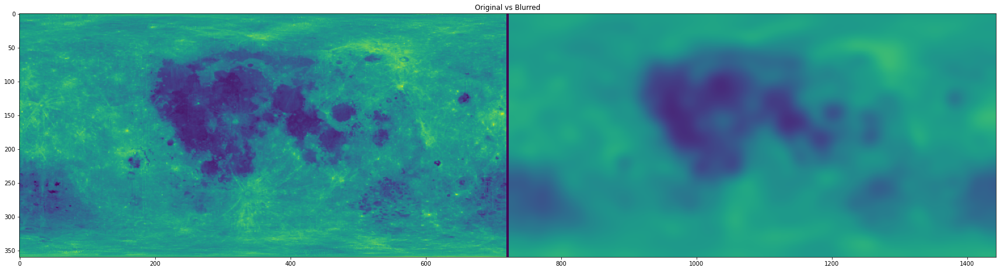

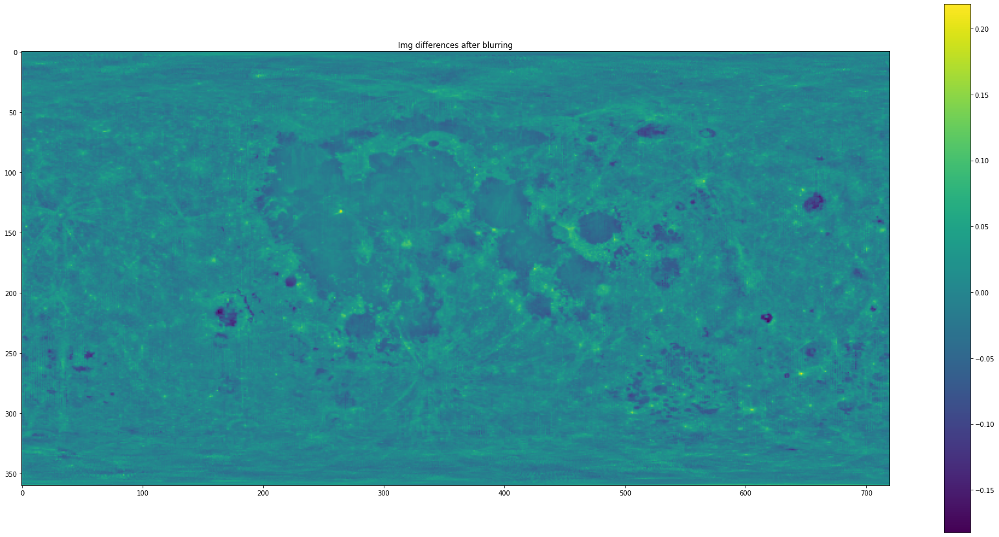

In [ ]:
light_original = datasets_img["light"]
light_blur = cv2.GaussianBlur(datasets_img["light"], ksize=(0,0), sigmaX = 9)

plot_side_by_side(light_original,light_blur, title="Original vs Blurred")

plt.figure(figsize=(30,15))
plt.title("Img differences after blurring")
plt.imshow((light_original-light_blur))
plt.colorbar();

Here we compare it against the adapatative gaussian blur that we created. Accordingly, we present the diference between the adaptative and the normal filter and additionally a map of how much sigma is applied to each pixel of the image.

Text(0.5, 1.0, 'KSize per pixel')

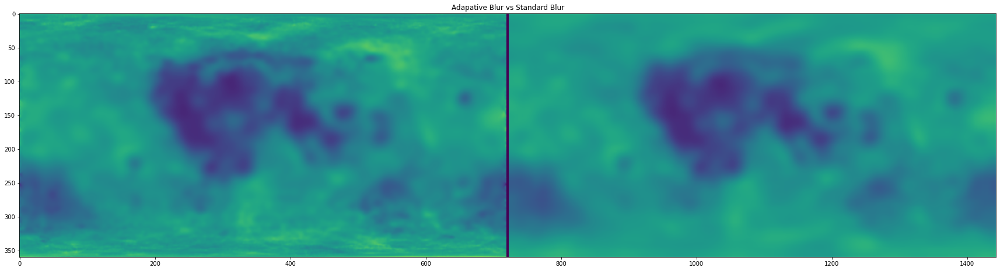

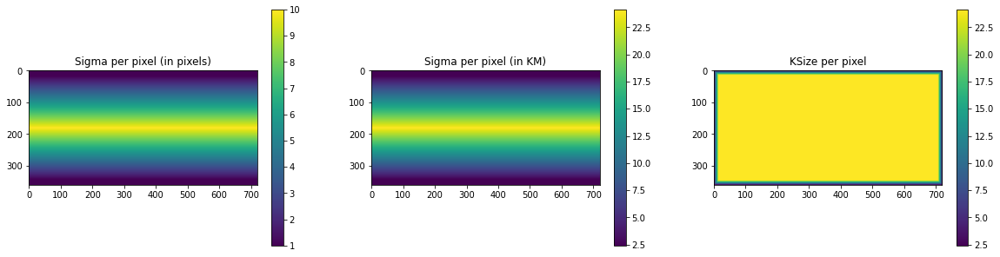

In [ ]:
z1,sigmas,ksizes = gaussianBlurAdaptative(datasets_img['light'], 29,10)
z2 = cv2.GaussianBlur(datasets_img['light'], ksize=(29,29), sigmaX=10)
plot_side_by_side(z1,z2, title="Adapative Blur vs Standard Blur")

fig, axs = plt.subplots(1, 3, figsize=(20,5))
im = axs[0].imshow(sigmas)
fig.colorbar(im, ax=axs[0])
axs[0].set_title("Sigma per pixel (in pixels)")

im = axs[1].imshow(1737*sigmas/720)
fig.colorbar(im, ax=axs[1])
axs[1].set_title("Sigma per pixel (in KM)")

img = axs[2].imshow(ksizes)
fig.colorbar(im, ax=axs[2])
axs[2].set_title("KSize per pixel")

## Parameter selection
We specify different ranges of values for ksize and sigma and also several types of borders for downscaling. These values will be used in our experiments to identify the best combination.

In [ ]:
ksizes = [0]+list(range(1,30,2))
sigmas = np.linspace(0.1,40,20)
borders = [cv2.BORDER_REPLICATE, cv2.BORDER_REFLECT, cv2.BORDER_DEFAULT]

### Sigma
Here we search for the best sigma value.

In [ ]:
scores_by_sigma = []
for sigma in sigmas:
  albedo_resolution = cv2.GaussianBlur(datasets_img["light"], ksize=(0,0), sigmaX=sigma)
  score = score_comparison(albedo_resolution, datasets_img, test=albedo_resolution)
  scores_by_sigma.append(score)

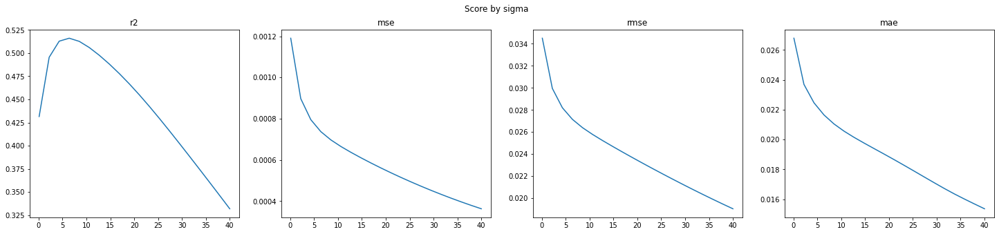

In [ ]:
plot_scores(sigmas, scores_by_sigma, title="Score by sigma")

We observe that in general, the higher the sigma, the better the model performs. However, we might be simplifying the prediction task by blurring so much the image and removing the high frequency components.

Thus, we choose a value of sigma that provides good results without blurring too much the image.

In [ ]:
best_sigma = 9

### kSize
Here we search for the best ksize value. We rely on the best sigma value that we have identified.

In [ ]:
scores_by_ksize = []
for ksize in ksizes:
  albedo_resolution = cv2.GaussianBlur(datasets_img["light"], ksize=(ksize,ksize), sigmaX=best_sigma)
  score = score_comparison(albedo_resolution, datasets_img, test=albedo_resolution)
  scores_by_ksize.append(score)

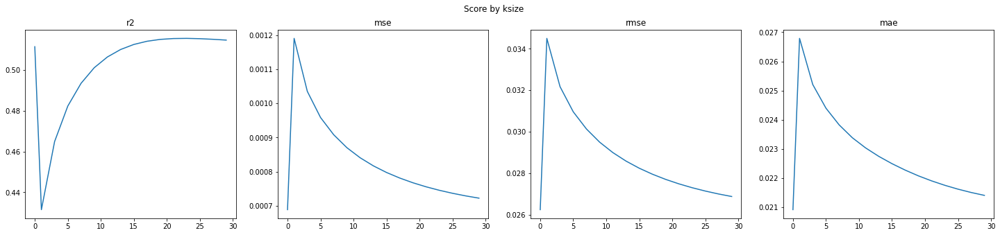

In [ ]:
plot_scores(ksizes, scores_by_ksize, title="Score by ksize")

Once again, the more blurry, the better the results are. We will use the default value "0", which automatically tunes the value based on the sigma and which seems to perform quite well.

In [ ]:
best_ksize = (0,0)

 ### Border
 Next, we will choose the best border type.



In [ ]:
scores_by_border = []
labels =  ["Replicate", "Reflect", "Default"]
for border in borders:
  albedo_resolution = cv2.GaussianBlur(datasets_img.get("light"), ksize=best_ksize, sigmaX=best_sigma, borderType=border)
  score = score_comparison(albedo_resolution, datasets_img, test=albedo_resolution)
  scores_by_border.append(score)

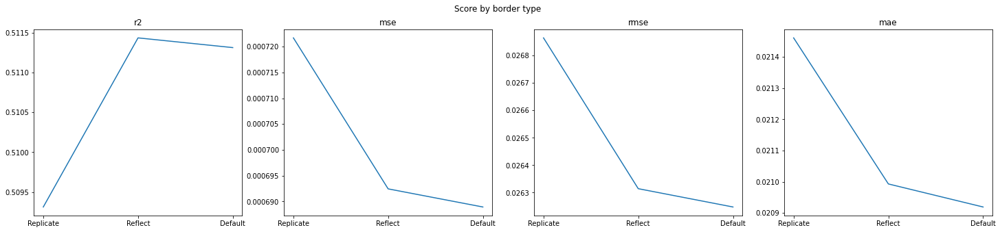

In [ ]:
plot_scores(labels, scores_by_border, "Score by border type")

The default downscaling method seems to be the one providing the best results, therefore we will stick with it.

### All together
Here we compare different combinations of sigma and ksize at the same time.

In [ ]:
configs = [
    (None,None),
    ((1,1), best_sigma),
    ((15,15), best_sigma),
    ((31,31), best_sigma),
    (best_ksize, best_sigma),
    (best_ksize, 100),
]

In [ ]:
fe,k,th,ti = datasets_img['fe'].flatten(), datasets_img['k'].flatten(), datasets_img['th'].flatten(), datasets_img['ti'].flatten()
original = datasets_img["light"]
train_set_x, train_set_y, test_set_x, test_set_y = split(datasets_img['light'].flatten(), fe,k,th,ti)

<BarContainer object of 6 artists>

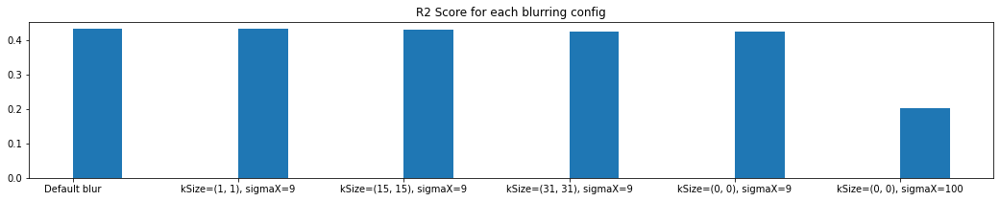

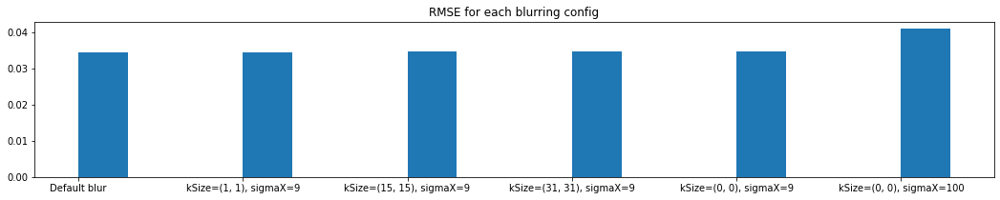

In [ ]:
models = []
descriptions = []
for kSize, sigmaX in configs:
  if kSize is None:
    light = datasets_img["light"]
    description = "Default blur"
  else:
    light = cv2.GaussianBlur(datasets_img["light"], ksize=kSize, sigmaX = sigmaX)
    description = f"kSize={kSize}, sigmaX={sigmaX}"
  models.append(train_model(light.flatten(), fe,k,th,ti))
  descriptions.append(description)

full_predictions = []
r2_scores = []
rmse_scores = []
for model in models:
  predicted = model.predict(test_set_x)
  r2_scores.append(skmetrics.r2_score(test_set_y,predicted))
  rmse_scores.append( skmetrics.mean_squared_error(test_set_y,predicted,squared=False))
  full_predicted = np.concatenate([model.predict(train_set_x), model.predict(test_set_x)]).reshape(360, 720)
  full_predictions.append(full_predicted)

plt.figure(figsize=(18, 3))
plt.title("R2 Score for each blurring config")
plt.bar(descriptions, r2_scores,align='edge', width=0.3)

plt.figure(figsize=(18, 3))
plt.title("RMSE for each blurring config")
plt.bar(descriptions, rmse_scores,align='edge', width=0.3)

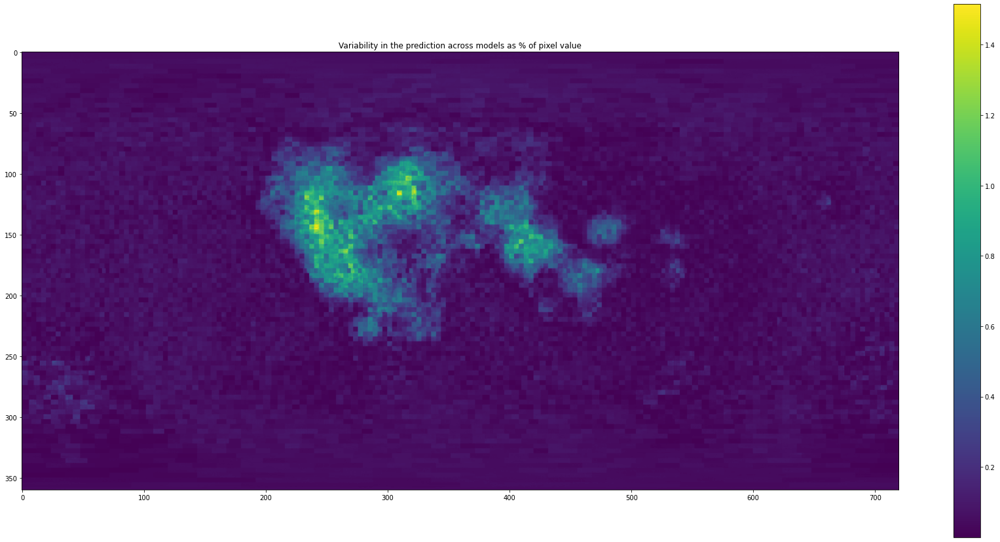

In [ ]:
max_values = np.amax(np.stack(full_predictions, axis=0), axis=(0))
min_values = np.amin(np.stack(full_predictions, axis=0), axis=(0))
diff = max_values - min_values
diff = (diff / datasets_img["light"])
plt.figure(figsize=(30,15))
plt.title("Variability in the prediction across models as % of pixel value")
plt.imshow(diff)
plt.colorbar()


We also performed a series of predictions with the same model and data in order to estimate an indication of the uncertainty of the predictions and a lower-limit threshold for flagging anomalous regions. We concluded that there is no varability in this case.

In [ ]:
full_predictions = []
n = 9
for i in range(n):
  model = train_model(datasets_img["light"].flatten(), fe,k,th,ti)
  print(f"Model {i+1}/{n}. Coefficients: {model.coef_}")
  predicted = model.predict(test_set_x)
  full_predicted = np.concatenate([model.predict(train_set_x), model.predict(test_set_x)]).reshape(360, 720)
  full_predictions.append(full_predicted)

Model 1/9. Coefficients: [-1.15996349e-02  4.19278188e-07  2.29474164e-04 -6.25585778e-03]
Model 2/9. Coefficients: [-1.15996349e-02  4.19278188e-07  2.29474164e-04 -6.25585778e-03]
Model 3/9. Coefficients: [-1.15996349e-02  4.19278188e-07  2.29474164e-04 -6.25585778e-03]
Model 4/9. Coefficients: [-1.15996349e-02  4.19278188e-07  2.29474164e-04 -6.25585778e-03]
Model 5/9. Coefficients: [-1.15996349e-02  4.19278188e-07  2.29474164e-04 -6.25585778e-03]
Model 6/9. Coefficients: [-1.15996349e-02  4.19278188e-07  2.29474164e-04 -6.25585778e-03]
Model 7/9. Coefficients: [-1.15996349e-02  4.19278188e-07  2.29474164e-04 -6.25585778e-03]
Model 8/9. Coefficients: [-1.15996349e-02  4.19278188e-07  2.29474164e-04 -6.25585778e-03]
Model 9/9. Coefficients: [-1.15996349e-02  4.19278188e-07  2.29474164e-04 -6.25585778e-03]


### Nearby pixels
We train a model using also the nearby pixels.

In [ ]:
train_set_x, train_set_y, test_set_x, test_set_y = split(datasets_img['light'].flatten(), fe,k,th,ti, shape=datasets_img["light"].shape, near=True)
model = train_model(datasets_img["light"].flatten(), fe,k,th,ti, shape=datasets_img["light"].shape, near=True)
predicted = model.predict(test_set_x)
print(f"r2: {skmetrics.r2_score(test_set_y,predicted)}")
print(f"rmse: {skmetrics.mean_squared_error(test_set_y,predicted,squared=False)}")
predicted_near = np.concatenate([model.predict(train_set_x), model.predict(test_set_x)]).reshape(358, 718)

r2: 0.4581311268082522
rmse: 0.03347782763852446


## Prediction analysis
Next, we will analyse the prediction obtained by using the optimal set of parameters.

### Model training
We train the model with different combination of parameters in order to select the best one.

In [ ]:
fe,k,th,ti = datasets_img['fe'].flatten(), datasets_img['k'].flatten(), datasets_img['th'].flatten(), datasets_img['ti'].flatten()
original = datasets_img["light"]
train_set_x, train_set_y, test_set_x, test_set_y = split(datasets_img['light'].flatten(), fe,k,th,ti)

We choose the models with the best parameters (with and without blur)

In [ ]:
light_original = datasets_img["light"]
model1 = train_model(light_original.flatten(),fe,k,th,ti)

In [ ]:
light_blur = cv2.GaussianBlur(datasets_img["light"], ksize=best_ksize, sigmaX = best_sigma)
model2 = train_model(light_blur.flatten(),fe,k,th,ti)

### Predicition
Finally, we generate predicted images based on ML Model in both: the original Moon and the blurred version of it.

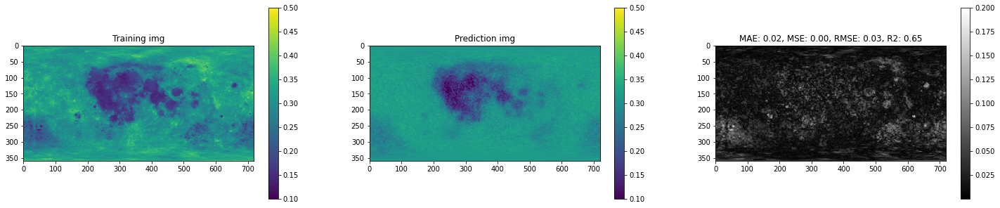

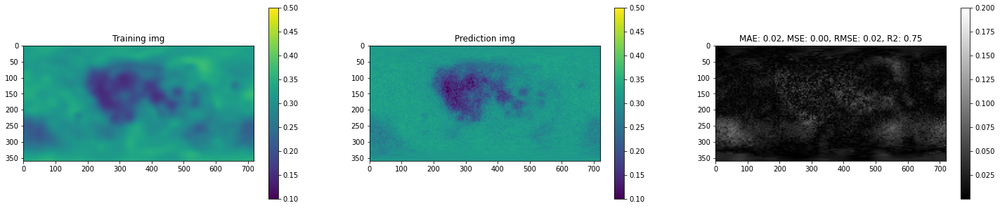

In [ ]:
predicted = np.concatenate([model1.predict(train_set_x), model1.predict(test_set_x)])
predicted = predicted.reshape(360,720)
predicted2 = np.concatenate([model2.predict(train_set_x), model2.predict(test_set_x)])
predicted2 = predicted2.reshape(360,720)
plot_prediction(light_original, predicted)
plot_prediction(light_blur, predicted2, light_blur)

We plot the according error maps.

Average difference per pixel: 0.0021468324299472596


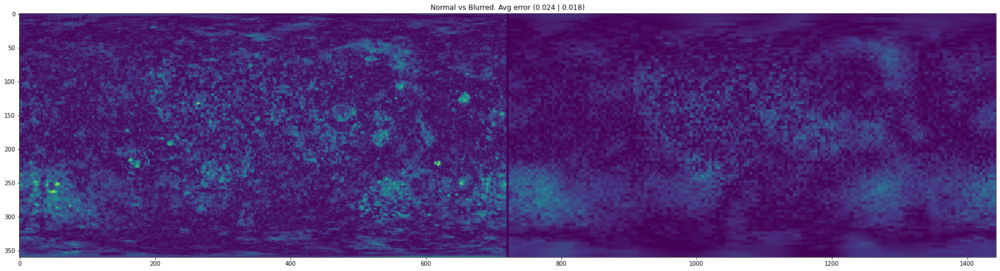

In [ ]:
error_img1, avg_error1 = error_map(light_original, predicted)
error_img2, avg_error2 = error_map(light_blur, predicted2)
plot_side_by_side(error_img1, error_img2,vmax=0.2,vmin=0., title=f"Normal vs Blurred. Avg error ({avg_error1:.3f} | {avg_error2:.3f})")
print(f"Average difference per pixel: {np.average(np.abs(predicted-predicted2))}")

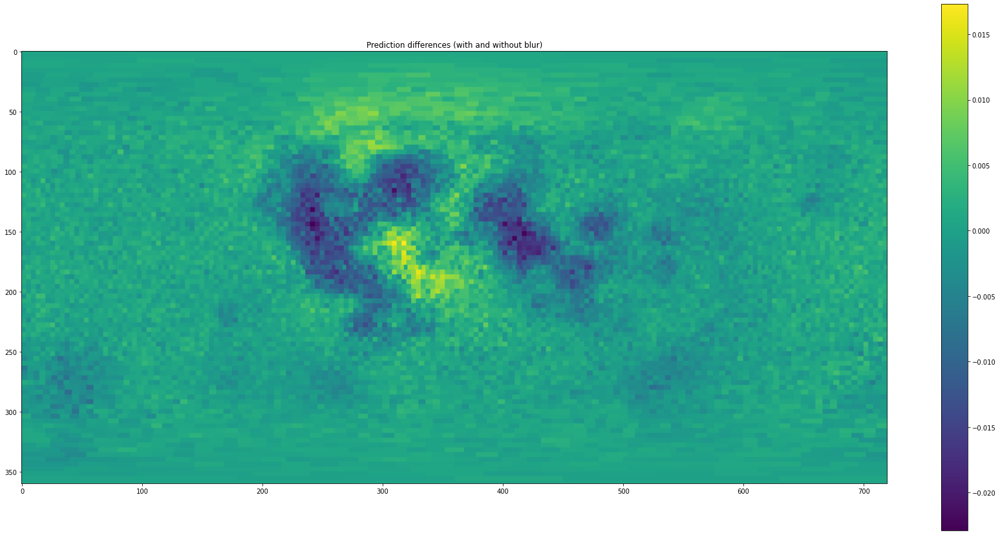

In [ ]:
plt.figure(figsize=(30,15))
plt.title("Prediction differences (with and without blur)")
plt.imshow((predicted-predicted2))
plt.colorbar();

Let's take a look at the prediction and the result of the blurring with more detail.

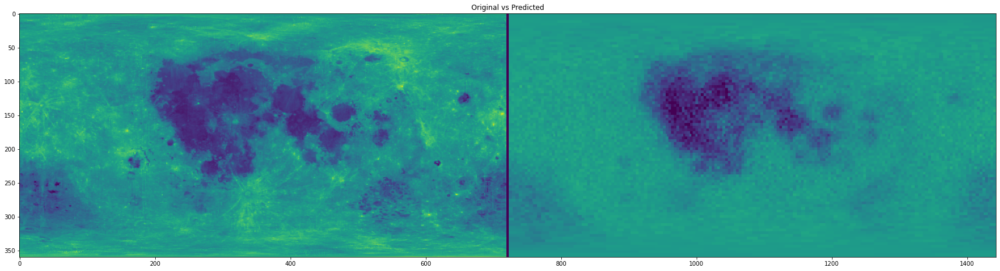

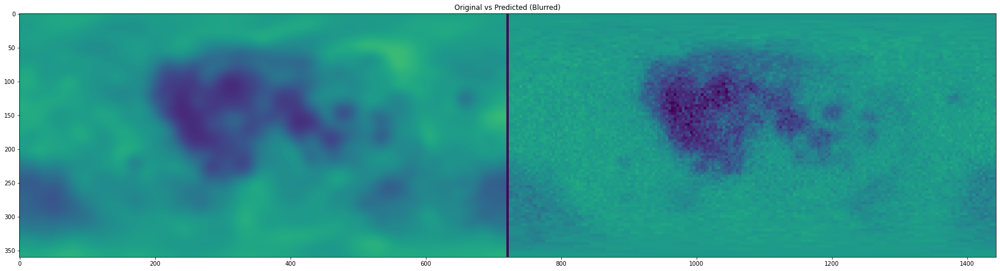

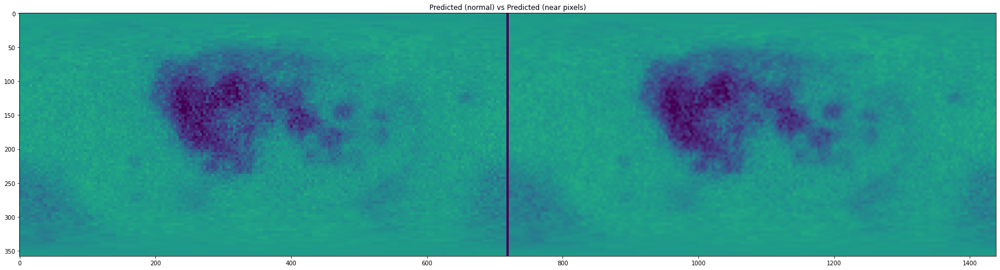

In [ ]:
plot_side_by_side(light_original,predicted, title="Original vs Predicted")
plot_side_by_side(light_blur, predicted2,title="Original vs Predicted (Blurred)")
plot_side_by_side(predicted[1:-1,1:-1], predicted_near,title="Predicted (normal) vs Predicted (near pixels)")

### Error map nearby pixels

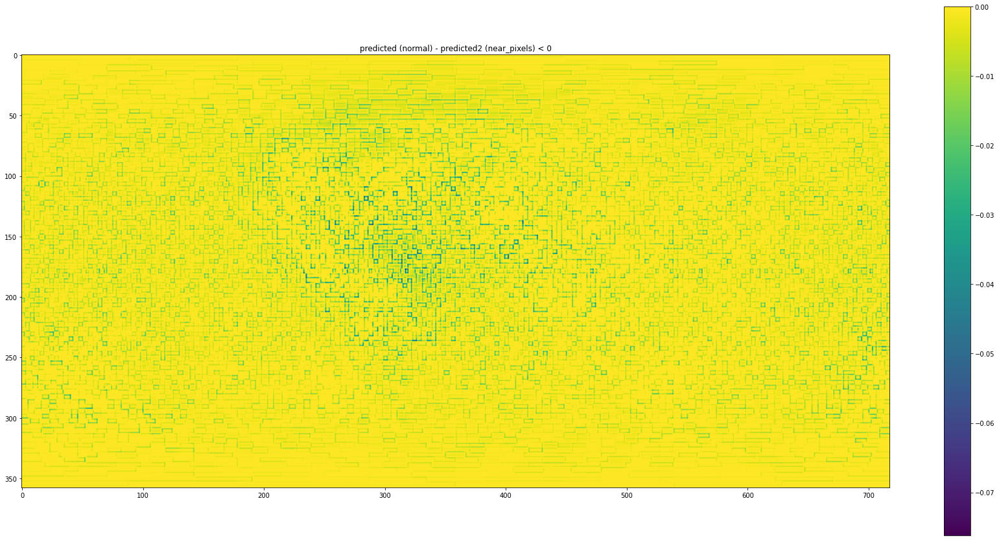

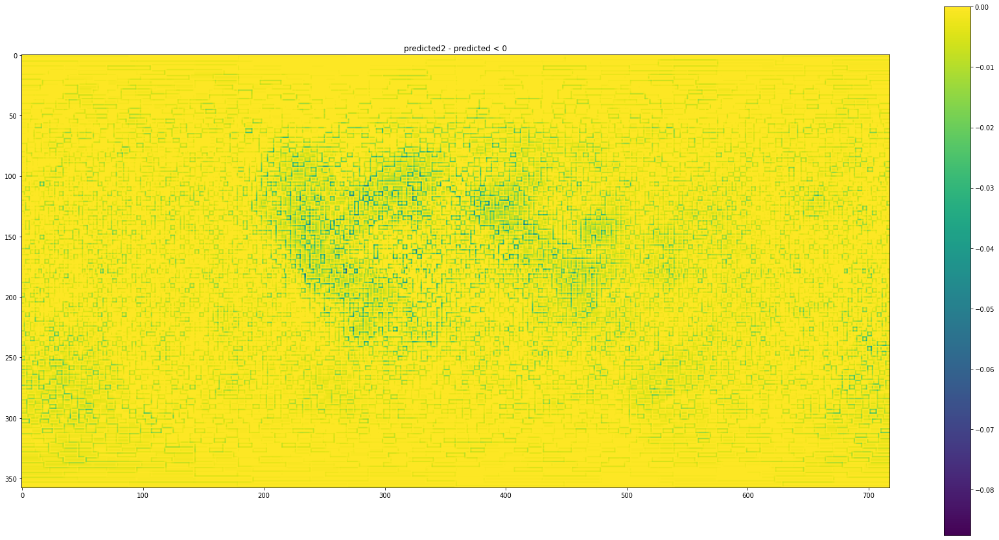

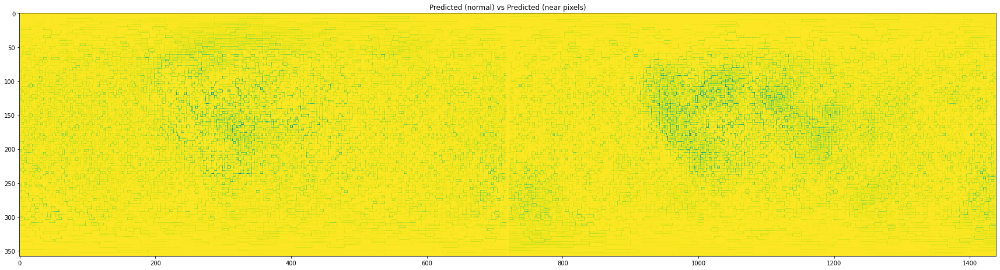

In [ ]:
plt.figure(figsize=(30,15))
plt.title("predicted (normal) - predicted2 (near_pixels) < 0")
v1 = (predicted[1:-1,1:-1]-predicted_near)
v = np.ma.masked_where(v1 > 0, v1)
v[v >= 0] = 0
plt.imshow(v)
plt.colorbar();
x1 = v

plt.figure(figsize=(30,15))
plt.title("predicted2 - predicted < 0")
v1 = (predicted[1:-1,1:-1]-predicted_near)
v1 = -v1
v = np.ma.masked_where(v1 > 0, v1)
v[v >= 0] = 0
plt.imshow(v)
plt.colorbar();
x2 = v

plot_side_by_side(x1, x2,title="Predicted (normal) vs Predicted (near pixels)", vmin=None,vmax=None)

### Error map

The prediction is fairly good but still it is not great on some parts of the image and the level of detail is a bit poor, although is probably due to the lower detail of the material maps.

Let´s check the error map.

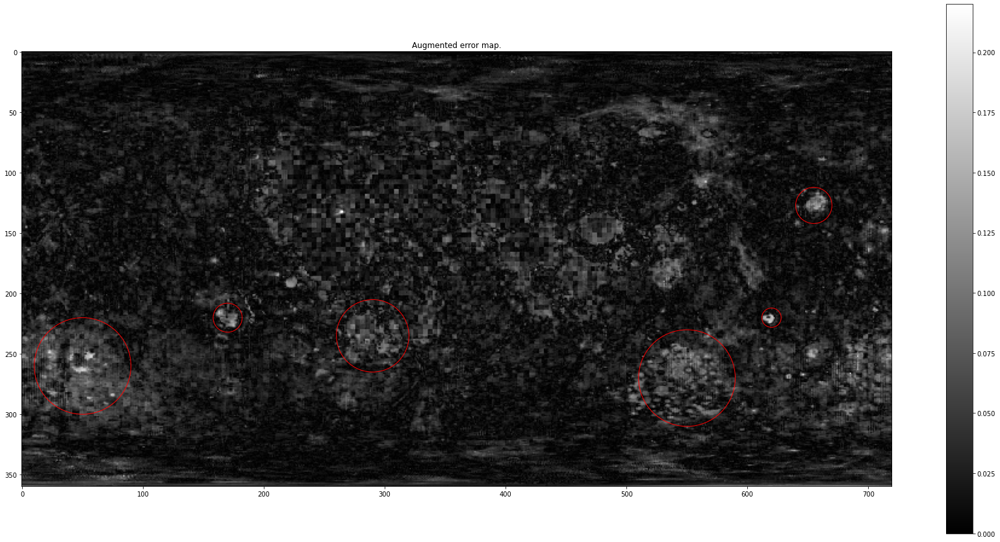

In [ ]:
f = plt.figure(figsize=(30,15))
error_img = np.abs(predicted-original)
im = plt.imshow(error_img, cmap='gray', vmin=0., vmax=0.22)
plt.colorbar()
plt.title("Augmented error map.")

c = Circle((50,260),40, fill=False, edgecolor="red")
f.axes[0].add_patch(c)
c = Circle((550,270),40, fill=False, edgecolor="red")
f.axes[0].add_patch(c)
c = Circle((290,235),30, fill=False, edgecolor="red")
f.axes[0].add_patch(c)
c = Circle((655,127),15, fill=False, edgecolor="red")
f.axes[0].add_patch(c)
c = Circle((170,220),12, fill=False, edgecolor="red")
f.axes[0].add_patch(c)
c = Circle((620,220),8, fill=False, edgecolor="red")
f.axes[0].add_patch(c)

Next, we created an interactive masked error map. The threshold can be changed using the slider. Moreover, the saturated option allows to see which error each pixel has.

In [ ]:
x = np.abs(predicted-original)
@interact(saturate=True, mask_threshold=widgets.FloatSlider(min=0., max=0.12, step=0.01, value=0.04),continuous_update=False)
def g(saturate, mask_threshold):
  f = plt.figure(figsize=(30,15))
  x1 = x.copy()
  x1 = np.ma.masked_where(x1 < mask_threshold, x1)
  if saturate:
    x1[x1 >= mask_threshold] = 1
  error_img = x1
  im = plt.imshow(error_img, cmap='Greys', vmax=0.12)#, cmap='Reds', vmin=0., vmax=0.2)
  plt.title("Masked error map.")
  plt.colorbar()

interactive(children=(Checkbox(value=True, description='saturate'), FloatSlider(value=0.04, description='mask_…

We implemented a routine to make contours of anomalous regions, based on variable thresholds, on top of the albedo maps.

In [ ]:
x = np.abs(predicted-light_blur)

@interact(mask_threshold=widgets.FloatSlider(min=0., max=0.12, step=0.01, value=0.04,continuous_update=False),min_area=widgets.IntSlider(min=0, max=300, step=10, value=40,continuous_update=False),filled=False,src_img=['original','predicted'], error_img=['normal','near_pixels'])
def g(mask_threshold, min_area, filled, src_img, error_img):
  if error_img == 'normal':
    x = np.abs(predicted-light_blur)
  elif error_img == 'near_pixels':
    x = np.abs(predicted_near - light_blur[1:-1,1:-1])
  f = plt.figure(figsize=(30,15))
  x1 = x.copy()
  x1 = np.ma.masked_where(x1 < mask_threshold, x1)
  x1[x1 >= mask_threshold] = 1
  x1 = np.array(x1 * 255, dtype = np.uint8)

  cnts, hiers  = cv2.findContours(x1, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  contours2 = []
  for cnt in cnts:
    area = cv2.contourArea(cnt)
    if area > min_area:
      contours2.append(cnt)
  if src_img == 'original':
    p = datasets_img["light"].copy()
  elif src_img == 'predicted':
    p = predicted.copy()

  norm = mpl.colors.Normalize()
  cmap = cm.viridis
  m = cm.ScalarMappable(norm=norm, cmap=cmap)
  p = m.to_rgba(p)

  p = np.array(p * 255, dtype = np.uint8)
  if filled:
    x2 = cv2.drawContours(p, contours2, -1, (255, 0, 0, 255),thickness=cv2.FILLED)
  else:
    x2 = cv2.drawContours(p, contours2, -1, (255, 0, 0, 255))
  plt.imshow(p)
  plt.title(f'min_area={min_area}, mask_threshold={mask_threshold}, src_img={src_img}, error_img={error_img}')


interactive(children=(FloatSlider(value=0.04, continuous_update=False, description='mask_threshold', max=0.12,…

In [ ]:
predicted_moon = predicted
predicted_moon_blur = predicted2

# Mercury

## Data loading
Load the datasets directly from Github.

In [ ]:
datasets_links = {"top_light": "mercury-albedo-top-half.png.csv",
                  "bottom_light" : "mercury-albedo-resized-bottom-half.png.csv",
            "alsi" : "alsimap_smooth_032015.png.csv",
            "casi" : "casimap_smooth_032015.png.csv",
            "fesi" : "fesimap_smooth_032015.png.csv",
            "mgsi" : "mgsimap_smooth_032015.png.csv",
            "ssi" : "ssimap_smooth_032015.png.csv"
            }

datasets_mercury = {}

for key, value in datasets_links.items():
    response = urllib.request.urlopen('https://raw.githubusercontent.com/strukovas/MLMAPPER/main/data/Mercury/'+value)
    lines = [l.decode('utf-8') for l in response.readlines()]
    datasets_mercury[key] = genfromtxt(lines, delimiter=',')
datasets_mercury["all_light"] = np.concatenate((datasets_mercury["top_light"], datasets_mercury["bottom_light"]))

In [ ]:
chemicals = ["alsi", "casi", "fesi", "mgsi", "ssi"]
datasets_chemicals = {}

for chemical in chemicals:
  datasets_chemicals[chemical] = cv2.resize(datasets_mercury[chemical], (1440,1440))

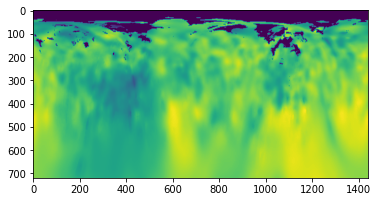

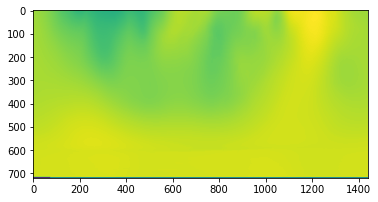

In [ ]:
def split_image(img):
  n,m = img.shape
  img1 = img[:n//2][:]
  img2 = img[n//2:][:]
  return img1, img2
  
a1,a2 = split_image(datasets_chemicals["alsi"])
plt.figure()
plt.imshow(a1)
plt.figure()
plt.imshow(a2)

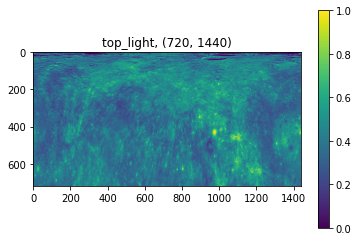

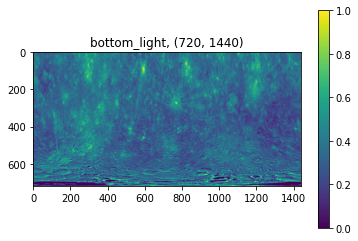

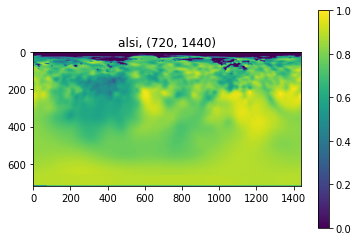

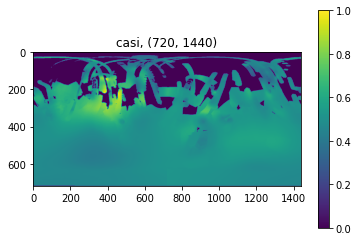

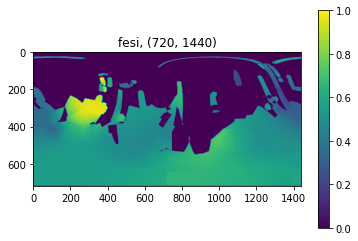

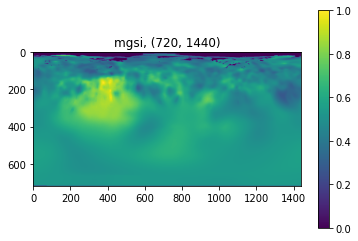

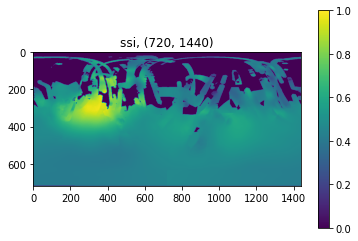

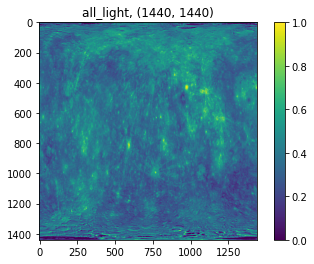

In [ ]:
for i, (name, img) in enumerate(datasets_mercury.items()):
    plt.figure(i)
    plt.title(f"{name}, {img.shape}")
    plt.imshow(img, vmin=0, vmax=1)
    plt.colorbar()

In [ ]:
masks = []
for chemical in chemicals:
  masks.append(get_mask(datasets_chemicals[chemical]))

Text(0.5, 1.0, 'Masked Albedo')

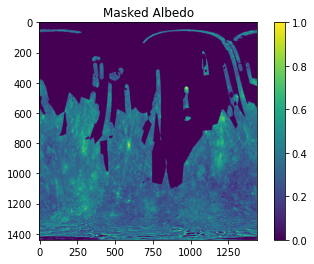

In [ ]:
masked_albedo = apply_masks(datasets_mercury["all_light"], masks)
plt.imshow(masked_albedo)
plt.colorbar()
plt.title("Masked Albedo")

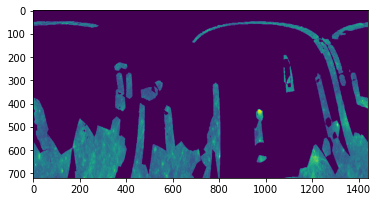

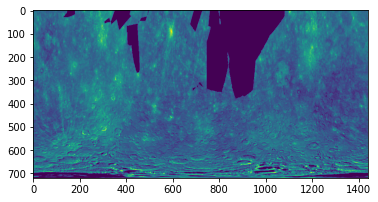

In [ ]:
a1,a2 = split_image(masked_albedo)
plt.figure()
plt.imshow(a1)
plt.figure()
plt.imshow(a2)

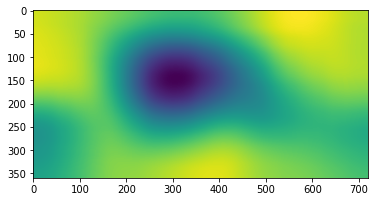

In [ ]:
z=cv2.GaussianBlur(datasets_img['light'], ksize=(199,199), sigmaX=70)
plt.imshow(z)

# Moon with Mercury mask (Mooncury)

In [ ]:
resized_masks = []
for mask in masks:
    resized_masks.append(cv2.resize(mask.astype('float32'), (720,360), interpolation = cv2.INTER_AREA))

In [ ]:
light_flat,fe_flat,k_flat,ti_flat,th_flat = apply_masks_to_imgs_flatten([datasets_img["light"],datasets_img["fe"],datasets_img["k"],datasets_img["ti"],datasets_img["th"]], resized_masks)

In [ ]:
print(f"Masked pixels: {len(light_flat)}/{360*720}")

Masked pixels: 148872/259200


In [ ]:
model = train_model(light_flat, fe_flat, k_flat, th_flat, ti_flat)
train_set_x, train_set_y, test_set_x, test_set_y = split(light_flat, fe_flat, k_flat, th_flat, ti_flat)
predicted = model.predict(test_set_x)
print("Metrics of model with mask on test set")
print(f"r2: {skmetrics.r2_score(test_set_y,predicted)}")
print(f"rmse: {skmetrics.mean_squared_error(test_set_y,predicted,squared=False)}")
print(f"mae: {skmetrics.mean_absolute_error(test_set_y,predicted)}")

Metrics of model with mask on test set
r2: 0.0981504558599332
rmse: 0.038662263908556274
mae: 0.02993448817124321


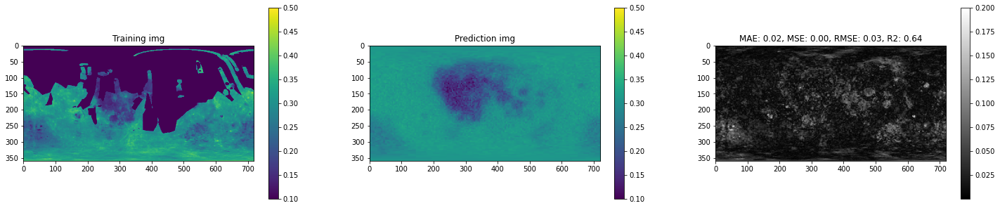

In [ ]:
train_set_x, train_set_y, test_set_x, test_set_y = split(datasets_img['light'].flatten(), fe,k,th,ti)
plot_prediction(datasets_img['light'], np.concatenate([model.predict(train_set_x), model.predict(test_set_x)]).reshape(360, 720), other=apply_masks(datasets_img['light'],resized_masks))

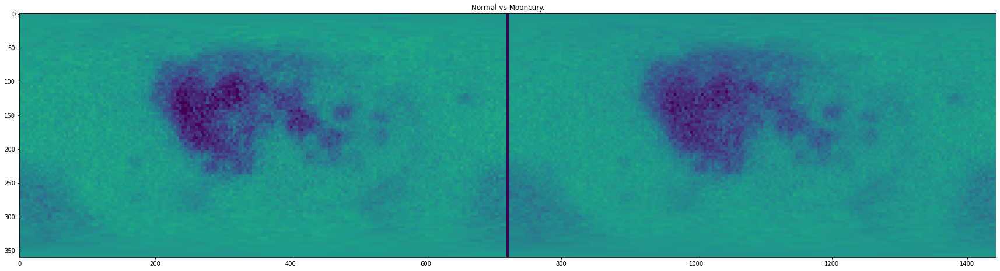

In [ ]:
plot_side_by_side(predicted_moon, np.concatenate([model.predict(train_set_x), model.predict(test_set_x)]).reshape(360, 720),vmax=0.5,vmin=0.1, title=f"Normal vs Mooncury.")

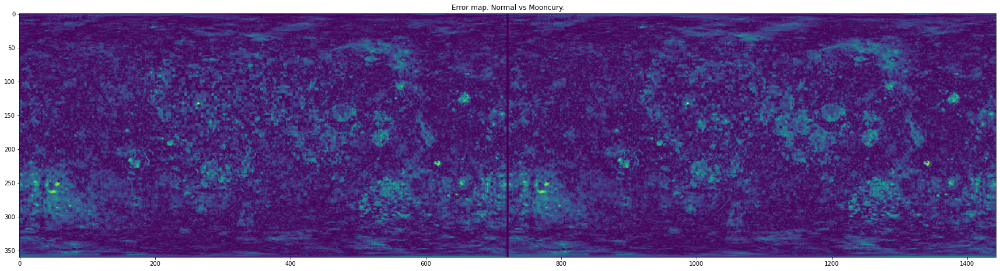

In [ ]:
x = np.abs(datasets_img['light'] - predicted_moon)
y = np.abs(datasets_img['light'] - np.concatenate([model.predict(train_set_x), model.predict(test_set_x)]).reshape(360, 720))
plot_side_by_side(x, y,vmax=0.2,vmin=0., title=f"Error map. Normal vs Mooncury.")

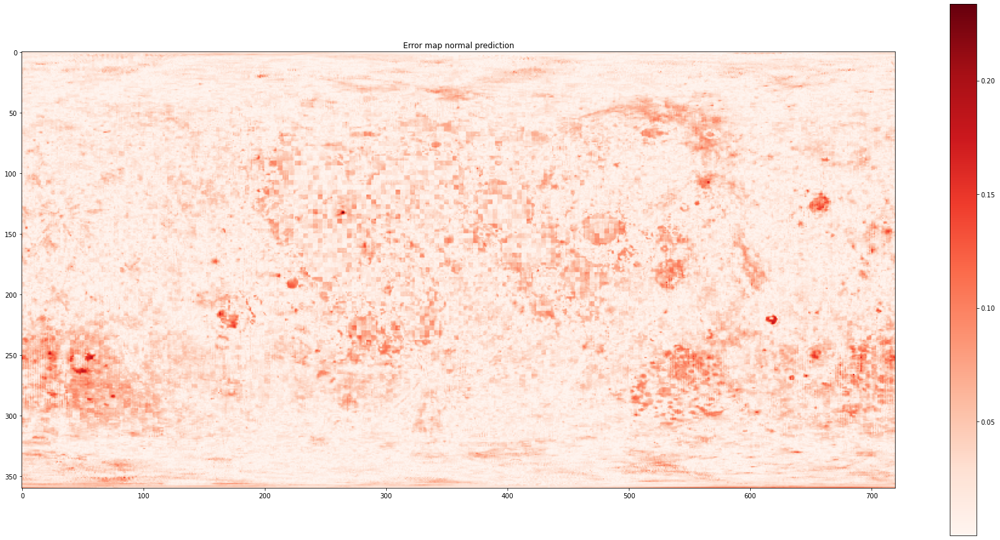

In [ ]:
plt.figure(figsize=(30,15))
plt.title("Error map normal prediction")
plt.imshow(x, cmap='Reds')
plt.colorbar();

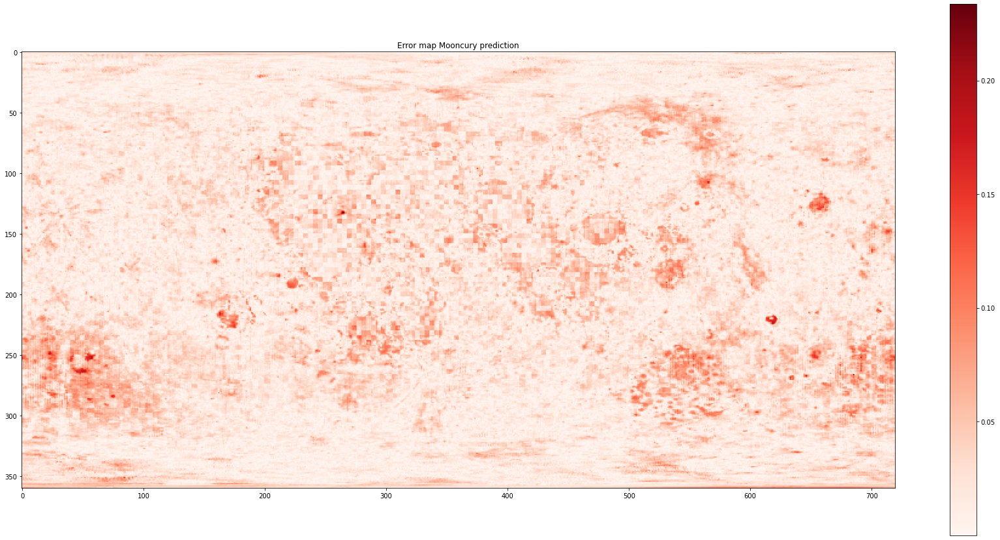

In [ ]:
plt.figure(figsize=(30,15))
plt.title("Error map Mooncury prediction")
plt.imshow(x, cmap='Reds')
plt.colorbar();